In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/Dataset/Validation/Fake/fake_12723.jpg
/kaggle/input/Dataset/Validation/Fake/fake_13601.jpg
/kaggle/input/Dataset/Validation/Fake/fake_1068.jpg
/kaggle/input/Dataset/Validation/Fake/fake_16385.jpg
/kaggle/input/Dataset/Validation/Fake/fake_3016.jpg
/kaggle/input/Dataset/Validation/Fake/fake_15715.jpg
/kaggle/input/Dataset/Validation/Fake/fake_19044.jpg
/kaggle/input/Dataset/Validation/Fake/fake_18989.jpg
/kaggle/input/Dataset/Validation/Fake/fake_8983.jpg
/kaggle/input/Dataset/Validation/Fake/fake_11540.jpg
/kaggle/input/Dataset/Validation/Fake/fake_4215.jpg
/kaggle/input/Dataset/Validation/Fake/fake_15619.jpg
/kaggle/input/Dataset/Validation/Fake/fake_7129.jpg
/kaggle/input/Dataset/Validation/Fake/fake_10301.jpg
/kaggle/input/Dataset/Validation/Fake/fake_1467.jpg
/kaggle/input/Dataset/Validation/Fake/fake_4367.jpg
/kaggle/input/Dataset/Validation/Fake/fake_5359.jpg
/kaggle/input/Dataset/Validation/Fake/fake_9191.jpg
/kaggle/input/Dataset/Validation/Fake/fake_19358.jpg
/k

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing import image
import seaborn as sns
from sklearn import metrics

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
main_path = '/kaggle/input/Dataset'

train_dir = os.path.join(main_path, 'Train')
valid_dir = os.path.join(main_path, 'Validation')
test_dir = os.path.join(main_path, 'Test')

In [4]:
print("Train_dir Subfolders: ", os.listdir(train_dir))
print("Valid_dir Subfolders: ", os.listdir(valid_dir))
print("Test_dir Subfolders: ", os.listdir(test_dir))

Train_dir Subfolders:  ['Fake', 'Real']
Valid_dir Subfolders:  ['Fake', 'Real']
Test_dir Subfolders:  ['Fake', 'Real']


In [5]:
images_df = {
    "folder":[],
    "image_path":[],
    "label":[]
}

for folder in os.listdir(main_path): #iterate on each train, valid and test folder
    for label in os.listdir(main_path + "/" + folder): #iterate on fake and real folders (labels)
        for img in glob.glob(main_path + "/" + folder + "/" + label + "/*.jpg"):
            images_df["folder"].append(folder)
            images_df["image_path"].append(img)
            images_df["label"].append(label)

In [6]:
images_df = pd.DataFrame(images_df)

In [7]:
images_df

,folder,image_path,label
0,Validation,/kaggle/input/Dataset/Validation/Fake/fake_127...,Fake
1,Validation,/kaggle/input/Dataset/Validation/Fake/fake_136...,Fake
2,Validation,/kaggle/input/Dataset/Validation/Fake/fake_106...,Fake
3,Validation,/kaggle/input/Dataset/Validation/Fake/fake_163...,Fake
4,Validation,/kaggle/input/Dataset/Validation/Fake/fake_301...,Fake
...,...,...,...
190330,Train,/kaggle/input/Dataset/Train/Real/real_49475.jpg,Real
190331,Train,/kaggle/input/Dataset/Train/Real/real_62763.jpg,Real
190332,Train,/kaggle/input/Dataset/Train/Real/real_51829.jpg,Real
190333,Train,/kaggle/input/Dataset/Train/Real/real_68728.jpg,Real


In [8]:
real_grouped_df = images_df[images_df['label'] == "Real"].groupby('folder')
fake_grouped_df = images_df[images_df['label'] == "Fake"].groupby('folder')

In [9]:
real_grouped_df.size()

folder
Test           5413
Train         70001
Validation    19787
dtype: int64

In [10]:
fake_grouped_df.size()


folder
Test           5492
Train         70001
Validation    19641
dtype: int64

In [11]:
image_train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
                                  rescale=1./255.,
                                  horizontal_flip=True,
                                  )

image_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

In [12]:
train_ds = image_train_gen.flow_from_directory(
    train_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary',
)

valid_ds = image_gen.flow_from_directory(
    valid_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary'
)

test_ds = image_gen.flow_from_directory(
    test_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary',
    shuffle=False) #shuffle disabled

Found 140002 images belonging to 2 classes.
Found 39428 images belonging to 2 classes.
Found 10905 images belonging to 2 classes.


In [13]:
def plot_images(img, label):
    plt.figure(figsize=[12, 12])
    for i in range(16):
        plt.subplot(4, 4, i+1)
        plt.imshow(img[i])
        plt.axis('off')
        if label[i] == 0:
            plt.title("Fake")
        else:
            plt.title("Real")

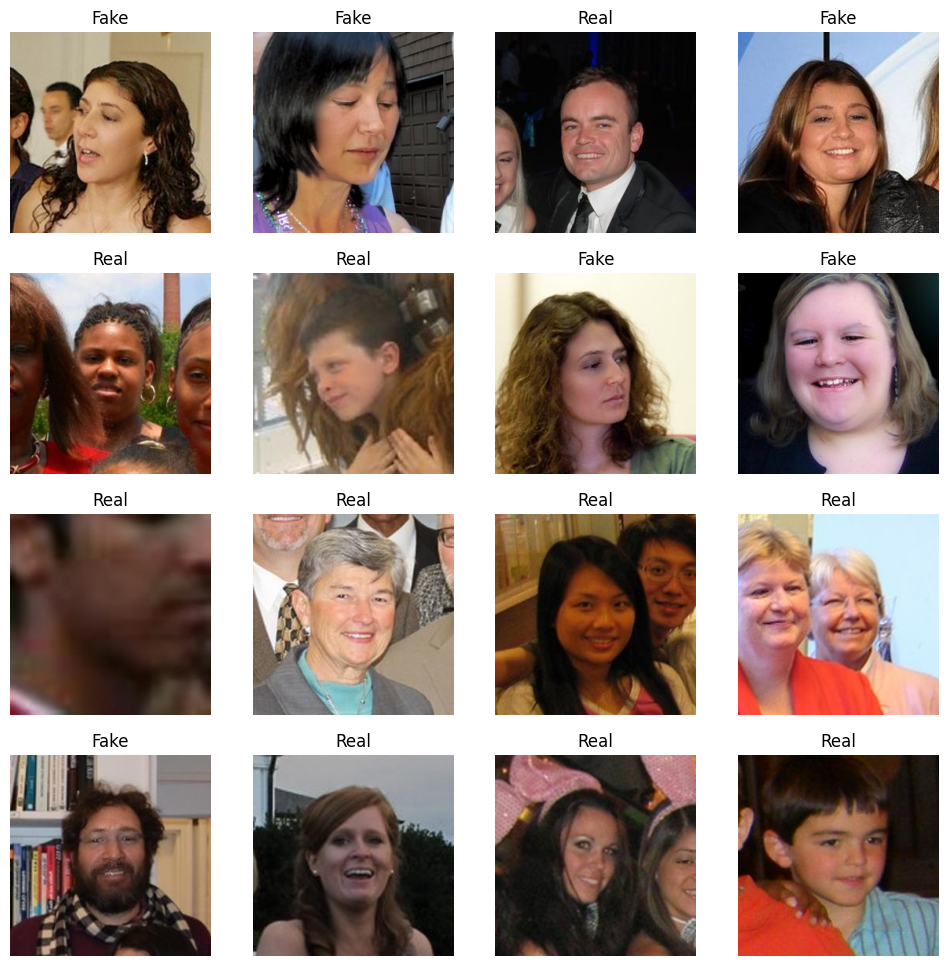

In [14]:
img,lbl = next(train_ds)
plot_images(img,lbl)

In [15]:
for img, label in train_ds:
    print("Values: ", img[0])
    print("Label: ", label[0])
    break

Values:  [[[0.27450982 0.31764707 0.15294118]
  [0.2627451  0.30588236 0.14117648]
  [0.23137257 0.28235295 0.10980393]
  ...
  [0.24705884 0.4039216  0.02352941]
  [0.3137255  0.47058827 0.09019608]
  [0.38431376 0.5411765  0.16078432]]

 [[0.25882354 0.3019608  0.13725491]
  [0.24705884 0.2901961  0.1254902 ]
  [0.21568629 0.25882354 0.09019608]
  ...
  [0.2392157  0.39607847 0.01568628]
  [0.2901961  0.44705886 0.06666667]
  [0.34509805 0.5019608  0.12156864]]

 [[0.25490198 0.28627452 0.1254902 ]
  [0.23529413 0.2784314  0.1137255 ]
  [0.20392159 0.24705884 0.08235294]
  ...
  [0.23137257 0.38823533 0.00784314]
  [0.25882354 0.4156863  0.03529412]
  [0.2901961  0.44705886 0.06666667]]

 ...

 [[0.26666668 0.2784314  0.40000004]
  [0.25882354 0.27450982 0.38823533]
  [0.24705884 0.25882354 0.3803922 ]
  ...
  [0.21176472 0.23529413 0.3372549 ]
  [0.22352943 0.24705884 0.34901962]
  [0.23137257 0.25490198 0.35686275]]

 [[0.2627451  0.27450982 0.4039216 ]
  [0.25490198 0.26666668 0.3

In [16]:
for img, label in train_ds:
    print(img.shape)
    print(label.shape)
    break

(64, 256, 256, 3)
(64,)


In [17]:
train_ds.class_indices

{'Fake': 0, 'Real': 1}

In [18]:
input_shape = (256, 256, 3) #define the input shape of our data

In [19]:
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2,ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler


In [20]:
# Create and compile the discriminator model
base_model = MobileNetV2(input_shape=(256, 256, 3), include_top=False, weights='imagenet')
base_model.trainable = False

9406464/9406464 [==============================] - 1s 0us/step


In [21]:
from tensorflow.keras import layers, models, regularizers
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'),
    layers.Dropout(0.4),
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu'),  # Additional dense layer
    layers.Dropout(0.4),
    layers.BatchNormalization(),
    layers.Dense(1, activation='sigmoid')
])

In [22]:
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

In [23]:
checkpoint_filepath = "model_cp.h5"

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_loss',
    mode='min', #minimize the loss value
    save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                     patience=5,
                                                     restore_best_weights=True,
                                                    )

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                 factor=0.2,
                                                 patience=3)

In [24]:

model.fit(
    train_ds,
    epochs=5,
    validation_data=valid_ds,
    callbacks=[checkpoint_cb, early_stopping_cb, reduce_lr]
)

Epoch 1/5
2188/2188 [==============================] - 1863s 847ms/step - loss: 0.4511 - accuracy: 0.7832 - val_loss: 0.4072 - val_accuracy: 0.8110 - lr: 0.0010
Epoch 2/5
2188/2188 [==============================] - 750s 343ms/step - loss: 0.4182 - accuracy: 0.8038 - val_loss: 0.4219 - val_accuracy: 0.8018 - lr: 0.0010
Epoch 3/5
2188/2188 [==============================] - 682s 312ms/step - loss: 0.4103 - accuracy: 0.8087 - val_loss: 0.3924 - val_accuracy: 0.8202 - lr: 0.0010
Epoch 4/5
2188/2188 [==============================] - 678s 310ms/step - loss: 0.4055 - accuracy: 0.8121 - val_loss: 0.3967 - val_accuracy: 0.8171 - lr: 0.0010
Epoch 5/5
2188/2188 [==============================] - 712s 325ms/step - loss: 0.3966 - accuracy: 0.8162 - val_loss: 0.4327 - val_accuracy: 0.7909 - lr: 0.0010


In [25]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test Accuracy: {test_accuracy}')

# Make predictions on the test set
predictions = (model.predict(test_ds) > 0.5).astype(int)

# Calculate additional metrics
true_labels = test_ds.classes
f1 = f1_score(true_labels, predictions)
precision = precision_score(true_labels, predictions)
recall = recall_score(true_labels, predictions)
conf_matrix = confusion_matrix(true_labels, predictions)

print(f'F1 Score: {f1}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'Confusion Matrix:\n{conf_matrix}')

171/171 [==============================] - 109s 637ms/step - loss: 0.6198 - accuracy: 0.6705
Test Accuracy: 0.6705181002616882
171/171 [==============================] - 34s 195ms/step
F1 Score: 0.5594114040465972
Precision: 0.8318745441283735
Recall: 0.4213929429152041
Confusion Matrix:
[[5031  461]
 [3132 2281]]


1/1 [==============================] - 1s 1s/step


Text(0.5, 1.0, 'This image is 59.42% Fake and 40.58% Real.')

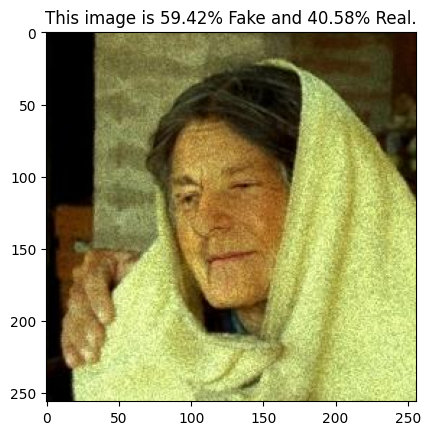

In [26]:
#real example
test_image = tf.keras.preprocessing.image.load_img('/kaggle/input/Dataset/Test/Fake/fake_0.jpg', target_size=(256, 256, 3))
plt.imshow(test_image)


test_image_arr = tf.keras.preprocessing.image.img_to_array(test_image)
test_image_arr = np.expand_dims(test_image, axis=0)
test_image_arr = test_image_arr/255.


result = model.predict(test_image_arr)

plt.title(f"This image is {100 * (1 - result[0][0]):.2f}% Fake and {100 * result[0][0]:.2f}% Real.")


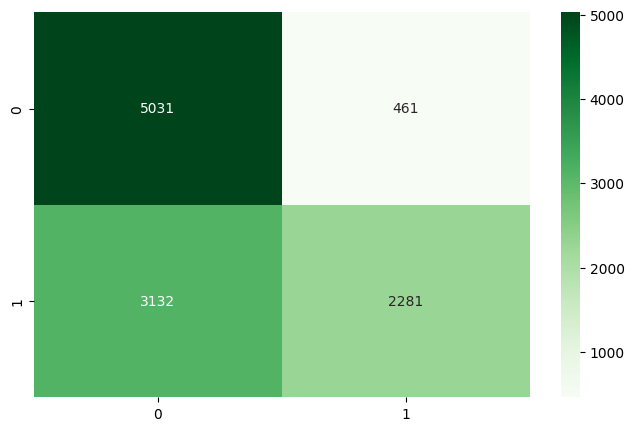

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
plt.figure(figsize = (8,5))
sns.heatmap(metrics.confusion_matrix(true_labels, predictions), annot = True,fmt="d",cmap = "Greens")
plt.show()